In [378]:
import pandas as pd
import pandas_datareader as pdr
import pandas_datareader.data as web
import numpy as np
import matplotlib.pyplot as plt
import datetime
import yfinance as yf
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
from scipy.optimize import minimize
import cvxpy as cp
import pytz
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import STL
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit
import statsmodels.tsa.api as smt
from copy import deepcopy
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import arma_order_select_ic
import warnings
warnings.filterwarnings("ignore")
import statsmodels.tools.eval_measures
import scipy 
from scipy import stats 
from statsmodels.tsa.api import VAR
from statsmodels.tsa.api import VARMAX
from statsmodels.tsa.api import VECM
from arch.unitroot import DFGLS, ADF, KPSS, PhillipsPerron
from statsmodels.tsa.vector_ar import vecm
import copulas
import var
from copulas.univariate import Univariate
from var import VaR, load_data
import pyfolio as pf
from statsmodels.regression.rolling import RollingOLS
import copulae
from copulas.multivariate import GaussianMultivariate
from statsmodels.distributions.copula.api import StudentTCopula
from copulas.bivariate import Gumbel
import copulas.visualization

In [215]:
def test_stationarity(data):
    rolling_mean = data.rolling(window=7).mean()
    rolling_std = data.rolling(window=7).std()
    
    fig, ax = plt.subplots(figsize=(20, 4))
    ax.plot(data, label='Original')
    ax.plot(rolling_mean, label='Rolling Mean')
    ax.plot(rolling_std, label='Rolling Std')
    
    ax.legend()
    ax.set_xlabel('Time')
    ax.set_ylabel('Value')
    plt.title('Rolling Mean and Standard Deviation - {}'.format(data.name))
    plt.tight_layout()
    plt.show()
    
    result = adfuller(data)
    print('Augumented Dickey-Fuller Test')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:', result[4])
    
def causality_vs_all(data, model):
    columns = data.columns.tolist()

    for i in range(len(columns)):
        vs = deepcopy(columns)
        tv = vs.pop(i)
        result = model.test_causality(tv, vs, kind='f')
        print(result.summary())
        
def causality_vs_each(data, model):
    columns = data.columns.tolist()

    for i in range(len(columns)):
        vs = deepcopy(columns)
        tv = vs.pop(i)
        for v in vs:
            result = model.test_causality(tv, v, kind='f')
            print(result.summary())

In [216]:
start_date = "2018-01-02"
end_date = "2023-10-31"
ticker = ["BTC-USD","GC=F","DX-Y.NYB","^GSPC","RIOT","^IXIC","LTC-USD","ETH-USD","^TNX", "^VIX"]
df = pd.DataFrame()
for i in ticker:
    # Use yfinance to fetch the gold price data
    data = yf.download(i, start=start_date, end=end_date, interval = "1d")
    df = pd.concat([df, data["Adj Close"]], axis=1)
    
df.columns = ticker
df.head(50)
df

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,BTC-USD,GC=F,DX-Y.NYB,^GSPC,RIOT,^IXIC,LTC-USD,ETH-USD,^TNX,^VIX
2018-01-02,14982.099609,1313.699951,91.849998,2695.810059,27.900000,7006.899902,255.684006,884.443970,2.465,9.77
2018-01-03,15201.000000,1316.199951,92.160004,2713.060059,24.360001,7065.529785,245.367996,962.719971,2.447,9.15
2018-01-04,15599.200195,1319.400024,91.849998,2723.989990,24.270000,7077.910156,241.369995,980.921997,2.453,9.22
2018-01-05,17429.500000,1320.300049,91.949997,2743.149902,24.430000,7136.560059,249.270996,997.719971,2.476,9.22
2018-01-06,17527.000000,NaN,NaN,NaN,NaN,NaN,296.454010,1041.680054,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2023-10-26,34156.648438,1987.199951,106.599998,4137.229980,9.790000,12595.610352,68.854385,1804.039307,4.845,20.68
2023-10-27,33909.800781,1988.599976,106.559998,4117.370117,9.540000,12643.009766,67.055794,1780.045288,4.845,21.27
2023-10-28,34089.574219,NaN,NaN,NaN,NaN,NaN,67.782776,1776.618164,NaN,NaN
2023-10-29,34538.480469,NaN,NaN,NaN,NaN,NaN,68.800842,1795.546021,NaN,NaN


In [217]:
trb = pd.read_csv("bitcoinity_data.csv")
vol = trb.iloc[2726:4854]
vol.index = df.index
vol = vol.drop("Time", axis=1).fillna(0).sum(axis=1)
vol

2018-01-02    185686.127910
2018-01-03    144496.221636
2018-01-04    170632.870059
2018-01-05    221194.445554
2018-01-06    123943.507604
                  ...      
2023-10-26     25184.327575
2023-10-27     22475.242245
2023-10-28      8045.740862
2023-10-29     10620.956768
2023-10-30     18419.606746
Length: 2128, dtype: float64

In [218]:
df["BTC-VOL"] = vol.to_numpy()

In [283]:
cir = pd.read_excel("total-bitcoins.xlsx")
cir2 = pd.DataFrame(cir["y"])
cir3 = cir2.iloc[2:]
cir3

,y
2,5.372500e+04
3,8.027500e+04
4,1.068250e+05
5,1.334750e+05
6,1.600250e+05
...,...
1496,1.951979e+07
1497,1.952312e+07
1498,1.952645e+07
1499,1.952978e+07


In [219]:
df

,BTC-USD,GC=F,DX-Y.NYB,^GSPC,RIOT,^IXIC,LTC-USD,ETH-USD,^TNX,^VIX,BTC-VOL
2018-01-02,14982.099609,1313.699951,91.849998,2695.810059,27.900000,7006.899902,255.684006,884.443970,2.465,9.77,185686.127910
2018-01-03,15201.000000,1316.199951,92.160004,2713.060059,24.360001,7065.529785,245.367996,962.719971,2.447,9.15,144496.221636
2018-01-04,15599.200195,1319.400024,91.849998,2723.989990,24.270000,7077.910156,241.369995,980.921997,2.453,9.22,170632.870059
2018-01-05,17429.500000,1320.300049,91.949997,2743.149902,24.430000,7136.560059,249.270996,997.719971,2.476,9.22,221194.445554
2018-01-06,17527.000000,NaN,NaN,NaN,NaN,NaN,296.454010,1041.680054,NaN,NaN,123943.507604
...,...,...,...,...,...,...,...,...,...,...,...
2023-10-26,34156.648438,1987.199951,106.599998,4137.229980,9.790000,12595.610352,68.854385,1804.039307,4.845,20.68,25184.327575
2023-10-27,33909.800781,1988.599976,106.559998,4117.370117,9.540000,12643.009766,67.055794,1780.045288,4.845,21.27,22475.242245
2023-10-28,34089.574219,NaN,NaN,NaN,NaN,NaN,67.782776,1776.618164,NaN,NaN,8045.740862
2023-10-29,34538.480469,NaN,NaN,NaN,NaN,NaN,68.800842,1795.546021,NaN,NaN,10620.956768


<Axes: >

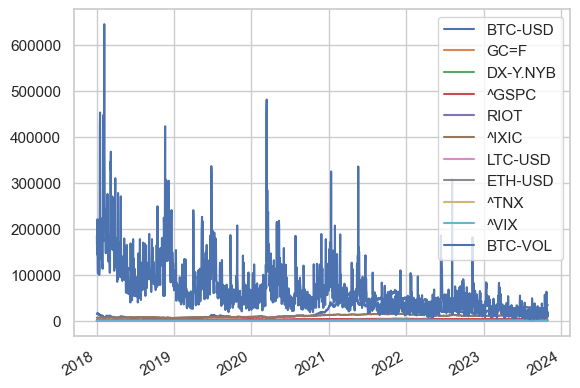

In [220]:
df.plot()

In [221]:
for column in df.columns:
    if df[column].isna().any():
        print(column)
        print(df[column].isna().sum())



GC=F
662
DX-Y.NYB
661
^GSPC
661
RIOT
661
^IXIC
661
^TNX
661
^VIX
661


In [222]:
df = df.interpolate()

<Axes: >

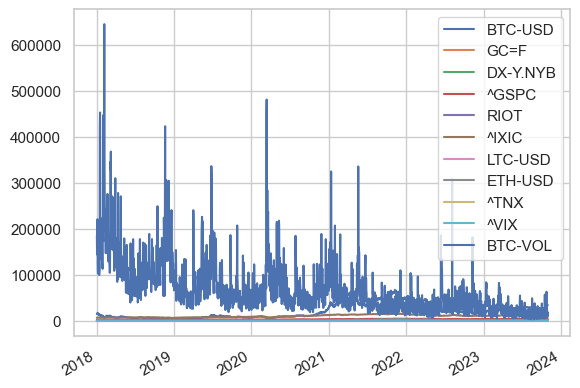

In [223]:
df.plot()

In [224]:
for column in df.columns:
    if df[column].isna().any():
        print(column)
        print(df[column].isna().sum())



In [225]:
df

,BTC-USD,GC=F,DX-Y.NYB,^GSPC,RIOT,^IXIC,LTC-USD,ETH-USD,^TNX,^VIX,BTC-VOL
2018-01-02,14982.099609,1313.699951,91.849998,2695.810059,27.900000,7006.899902,255.684006,884.443970,2.465000,9.770000,185686.127910
2018-01-03,15201.000000,1316.199951,92.160004,2713.060059,24.360001,7065.529785,245.367996,962.719971,2.447000,9.150000,144496.221636
2018-01-04,15599.200195,1319.400024,91.849998,2723.989990,24.270000,7077.910156,241.369995,980.921997,2.453000,9.220000,170632.870059
2018-01-05,17429.500000,1320.300049,91.949997,2743.149902,24.430000,7136.560059,249.270996,997.719971,2.476000,9.220000,221194.445554
2018-01-06,17527.000000,1319.733358,92.076665,2744.669922,24.093334,7143.503418,296.454010,1041.680054,2.477333,9.320000,123943.507604
...,...,...,...,...,...,...,...,...,...,...,...
2023-10-26,34156.648438,1987.199951,106.599998,4137.229980,9.790000,12595.610352,68.854385,1804.039307,4.845000,20.680000,25184.327575
2023-10-27,33909.800781,1988.599976,106.559998,4117.370117,9.540000,12643.009766,67.055794,1780.045288,4.845000,21.270000,22475.242245
2023-10-28,34089.574219,1991.133301,106.413333,4133.853353,9.563333,12691.833333,67.782776,1776.618164,4.855000,20.763334,8045.740862
2023-10-29,34538.480469,1993.666626,106.266668,4150.336589,9.586666,12740.656901,68.800842,1795.546021,4.865000,20.256667,10620.956768


In [226]:
df.to_excel("bitcoin.xlsx")

In [227]:
ggl1 = pd.read_csv("multiTimeline-6.csv", sep=",")
ggl1 = ggl1.replace({0: 0.1})
ggl1 = ggl1.drop(ggl1.tail(2).index)
ggl1


,0
2018-01-02,53.0
2018-01-03,39.0
2018-01-04,46.0
2018-01-05,49.0
2018-01-06,40.0
...,...
2018-09-22,0.1
2018-09-23,0.1
2018-09-24,0.1
2018-09-25,6.0


In [228]:
ggl2 = pd.read_csv("multiTimeline-7.csv", sep=",")
ggl2 = ggl2.replace({0: 0.1})
ggl2 = ggl2/24*20
ggl2 = ggl2.drop(ggl2.tail(1).index)
ggl2

,0
2018-09-27,20.000000
2018-09-28,14.166667
2018-09-29,13.333333
2018-09-30,0.083333
2018-10-01,43.333333
...,...
2019-06-18,41.666667
2019-06-19,13.333333
2019-06-20,20.000000
2019-06-21,55.000000


In [229]:
ggl3 = pd.read_csv("multiTimeline-8.csv", sep=",")
ggl3 = ggl3.replace({0: 0.1})
ggl3 = ggl3/34*34.166667
ggl3 = ggl3.drop(ggl3.tail(1).index)
ggl3

,0
2019-06-23,34.166667
2019-06-24,50.245099
2019-06-25,46.225491
2019-06-26,85.416667
2019-06-27,87.426471
...,...
2020-03-13,100.490197
2020-03-14,47.230393
2020-03-15,33.161765
2020-03-16,68.333334


In [230]:
ggl4 = pd.read_csv("multiTimeline-9.csv", sep=",")
ggl4 = ggl4.replace({0: 0.1})
ggl4 = ggl4/45*37.181373
ggl4 = ggl4.drop(ggl4.tail(1).index)
ggl4

,0
2020-03-18,37.181373
2020-03-19,61.968955
2020-03-20,61.968955
2020-03-21,28.092593
2020-03-22,27.266340
...,...
2020-12-05,20.656318
2020-12-06,56.185186
2020-12-07,0.082625
2020-12-08,21.482571


In [231]:
ggl5 = pd.read_csv("multiTimeline-10.csv", sep=",")
ggl5 = ggl5.replace({0: 0.1})
ggl5 = ggl5/4*26.440087
ggl5 = ggl5.drop(ggl5.tail(1).index)
ggl5 

,0
2020-12-10,26.440087
2020-12-11,46.270152
2020-12-12,79.320261
2020-12-13,66.100217
2020-12-14,72.710239
...,...
2021-08-27,85.930283
2021-08-28,99.150326
2021-08-29,79.320261
2021-08-30,33.050109


In [232]:
ggl6 = pd.read_csv("multiTimeline-11.csv", sep=",")
ggl6 = ggl6.replace({0: 0.1})
ggl6 = ggl6/22*39.660130
ggl6 = ggl6.drop(ggl6.tail(1).index)
ggl6

,0
2021-09-01,39.660130
2021-09-02,37.857397
2021-09-03,66.701128
2021-09-04,66.701128
2021-09-05,79.320260
...,...
2022-04-26,21.632798
2022-04-27,52.279262
2022-04-28,70.306594
2022-04-29,37.857397


In [233]:
ggl7 = pd.read_csv("multiTimeline-12.csv", sep=",")
ggl7 = ggl7.replace({0: 0.1})
ggl7 = ggl7/22*34.251930
ggl7 = ggl7.drop(ggl7.tail(1).index)
ggl7

,0
2022-05-01,34.251930
2022-05-02,45.150271
2022-05-03,32.695024
2022-05-04,24.910495
2022-05-05,0.155691
...,...
2022-12-27,35.808836
2022-12-28,21.796683
2022-12-29,40.479554
2022-12-30,21.796683


In [234]:
ggl8 = pd.read_csv("multiTimeline-13.csv", sep=",")
ggl8 = ggl8.replace({0: 0.1})
ggl8 = ggl8/51*24.910495
ggl8 = ggl8.drop(ggl8.tail(1).index)
ggl8

,0
2023-01-01,24.910495
2023-01-02,10.257263
2023-01-03,20.026084
2023-01-04,12.211027
2023-01-05,31.748670
...,...
2023-08-27,16.606997
2023-08-28,7.326616
2023-08-29,22.468290
2023-08-30,10.257263


In [235]:
ggl9 = pd.read_csv("multiTimeline-14.csv", sep=",")
ggl9 = ggl9.replace({0: 0.1})
ggl9 = ggl9/36*29.794906
ggl9

,0
2023-09-01,29.794906
2023-09-02,19.863271
2023-09-03,0.082764
2023-09-04,35.588360
2023-09-05,21.518543
...,...
2023-10-26,26.484361
2023-10-27,19.863271
2023-10-28,24.001452
2023-10-29,0.082764


In [236]:
ggl = pd.concat([ggl1, ggl2, ggl3, ggl4, ggl5, ggl6, ggl7, ggl8, ggl9])
ggl

,0
2018-01-02,53.000000
2018-01-03,39.000000
2018-01-04,46.000000
2018-01-05,49.000000
2018-01-06,40.000000
...,...
2023-10-26,26.484361
2023-10-27,19.863271
2023-10-28,24.001452
2023-10-29,0.082764


<Axes: >

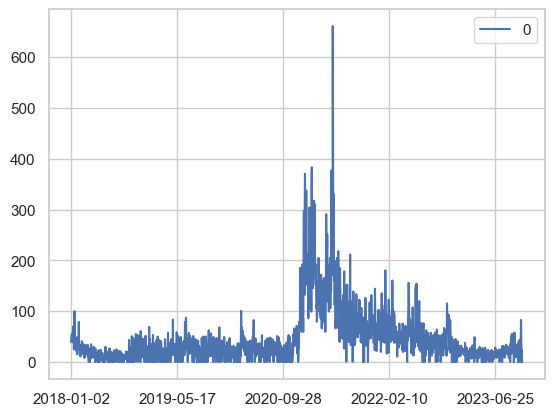

In [237]:
ggl.plot()

In [238]:
df["ggl"] = ggl.to_numpy()
df

,BTC-USD,GC=F,DX-Y.NYB,^GSPC,RIOT,^IXIC,LTC-USD,ETH-USD,^TNX,^VIX,BTC-VOL,ggl
2018-01-02,14982.099609,1313.699951,91.849998,2695.810059,27.900000,7006.899902,255.684006,884.443970,2.465000,9.770000,185686.127910,53.000000
2018-01-03,15201.000000,1316.199951,92.160004,2713.060059,24.360001,7065.529785,245.367996,962.719971,2.447000,9.150000,144496.221636,39.000000
2018-01-04,15599.200195,1319.400024,91.849998,2723.989990,24.270000,7077.910156,241.369995,980.921997,2.453000,9.220000,170632.870059,46.000000
2018-01-05,17429.500000,1320.300049,91.949997,2743.149902,24.430000,7136.560059,249.270996,997.719971,2.476000,9.220000,221194.445554,49.000000
2018-01-06,17527.000000,1319.733358,92.076665,2744.669922,24.093334,7143.503418,296.454010,1041.680054,2.477333,9.320000,123943.507604,40.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-26,34156.648438,1987.199951,106.599998,4137.229980,9.790000,12595.610352,68.854385,1804.039307,4.845000,20.680000,25184.327575,26.484361
2023-10-27,33909.800781,1988.599976,106.559998,4117.370117,9.540000,12643.009766,67.055794,1780.045288,4.845000,21.270000,22475.242245,19.863271
2023-10-28,34089.574219,1991.133301,106.413333,4133.853353,9.563333,12691.833333,67.782776,1776.618164,4.855000,20.763334,8045.740862,24.001452
2023-10-29,34538.480469,1993.666626,106.266668,4150.336589,9.586666,12740.656901,68.800842,1795.546021,4.865000,20.256667,10620.956768,0.082764


In [239]:
df2 = np.log(df)
df2

,BTC-USD,GC=F,DX-Y.NYB,^GSPC,RIOT,^IXIC,LTC-USD,ETH-USD,^TNX,^VIX,BTC-VOL,ggl
2018-01-02,9.614611,7.180603,4.520157,7.899454,3.328627,8.854651,5.543942,6.784959,0.902192,2.279317,12.131813,3.970292
2018-01-03,9.629116,7.182504,4.523526,7.905832,3.192942,8.862983,5.502759,6.869763,0.894863,2.213754,11.881009,3.663562
2018-01-04,9.654975,7.184932,4.520157,7.909853,3.189241,8.864734,5.486331,6.888493,0.897312,2.221375,12.047270,3.828641
2018-01-05,9.765919,7.185614,4.521245,7.916862,3.195812,8.872986,5.518541,6.905473,0.906644,2.221375,12.306797,3.891820
2018-01-06,9.771498,7.185185,4.522622,7.917416,3.181935,8.873959,5.691892,6.948590,0.907183,2.232163,11.727581,3.688879
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-26,10.438713,7.594482,4.669083,8.327782,2.281361,9.441104,4.231994,7.497783,1.577947,3.029167,10.133977,3.276554
2023-10-27,10.431459,7.595186,4.668708,8.322970,2.255493,9.444860,4.205525,7.484394,1.577947,3.057298,10.020170,2.988872
2023-10-28,10.436747,7.596459,4.667331,8.326965,2.257936,9.448714,4.216308,7.482467,1.580009,3.033189,8.992898,3.178114
2023-10-29,10.449829,7.597731,4.665952,8.330945,2.260373,9.452553,4.231216,7.493064,1.582067,3.008484,9.270584,-2.491767


In [141]:
for column in df.columns:
    df[column] = np.log(df[column]/ df[column].shift(1))
df
    

,BTC-USD,GC=F,DX-Y.NYB,^GSPC,RIOT,^IXIC,LTC-USD,ETH-USD,^TNX,^VIX,BTC-VOL,ggl
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,0.014505,0.001901,0.003369,0.006378,-0.135684,0.008333,-0.041183,0.084803,-0.007329,-0.065563,-0.250804,-0.306730
2018-01-04,0.025858,0.002428,-0.003369,0.004021,-0.003701,0.001751,-0.016428,0.018730,0.002449,0.007621,0.166261,0.165080
2018-01-05,0.110945,0.000682,0.001088,0.007009,0.006571,0.008252,0.032210,0.016980,0.009333,0.000000,0.259528,0.063179
2018-01-06,0.005578,-0.000429,0.001377,0.000554,-0.013877,0.000972,0.173351,0.043117,0.000538,0.010788,-0.579216,-0.202941
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-26,-0.010084,0.001561,0.000657,-0.011903,-0.075712,-0.017753,0.002319,0.009268,-0.022046,0.023980,-0.208418,-0.628609
2023-10-27,-0.007253,0.000704,-0.000375,-0.004812,-0.025868,0.003756,-0.026469,-0.013389,0.000000,0.028131,-0.113808,-0.287682
2023-10-28,0.005288,0.001273,-0.001377,0.003995,0.002443,0.003854,0.010783,-0.001927,0.002062,-0.024109,-1.027271,0.189242
2023-10-29,0.013082,0.001271,-0.001379,0.003979,0.002437,0.003839,0.014908,0.010598,0.002058,-0.024705,0.277686,-5.669881


In [142]:
df_ = df.drop(df.head(1).index)
df_

,BTC-USD,GC=F,DX-Y.NYB,^GSPC,RIOT,^IXIC,LTC-USD,ETH-USD,^TNX,^VIX,BTC-VOL,ggl
2018-01-03,0.014505,0.001901,0.003369,0.006378,-0.135684,0.008333,-0.041183,0.084803,-0.007329,-0.065563,-0.250804,-0.306730
2018-01-04,0.025858,0.002428,-0.003369,0.004021,-0.003701,0.001751,-0.016428,0.018730,0.002449,0.007621,0.166261,0.165080
2018-01-05,0.110945,0.000682,0.001088,0.007009,0.006571,0.008252,0.032210,0.016980,0.009333,0.000000,0.259528,0.063179
2018-01-06,0.005578,-0.000429,0.001377,0.000554,-0.013877,0.000972,0.173351,0.043117,0.000538,0.010788,-0.579216,-0.202941
2018-01-07,-0.061741,-0.000429,0.001375,0.000554,-0.014072,0.000972,-0.027367,0.101680,0.000538,0.010672,-0.186703,0.354172
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-26,-0.010084,0.001561,0.000657,-0.011903,-0.075712,-0.017753,0.002319,0.009268,-0.022046,0.023980,-0.208418,-0.628609
2023-10-27,-0.007253,0.000704,-0.000375,-0.004812,-0.025868,0.003756,-0.026469,-0.013389,0.000000,0.028131,-0.113808,-0.287682
2023-10-28,0.005288,0.001273,-0.001377,0.003995,0.002443,0.003854,0.010783,-0.001927,0.002062,-0.024109,-1.027271,0.189242
2023-10-29,0.013082,0.001271,-0.001379,0.003979,0.002437,0.003839,0.014908,0.010598,0.002058,-0.024705,0.277686,-5.669881


<Axes: >

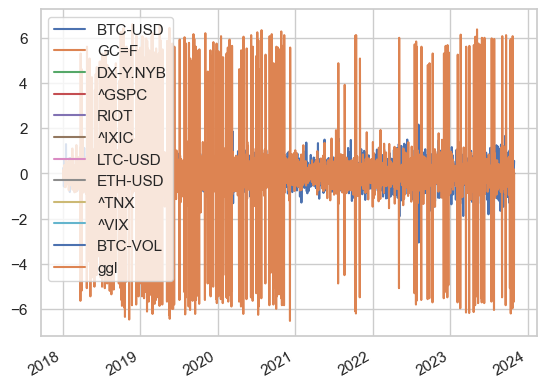

In [143]:
df_.plot()

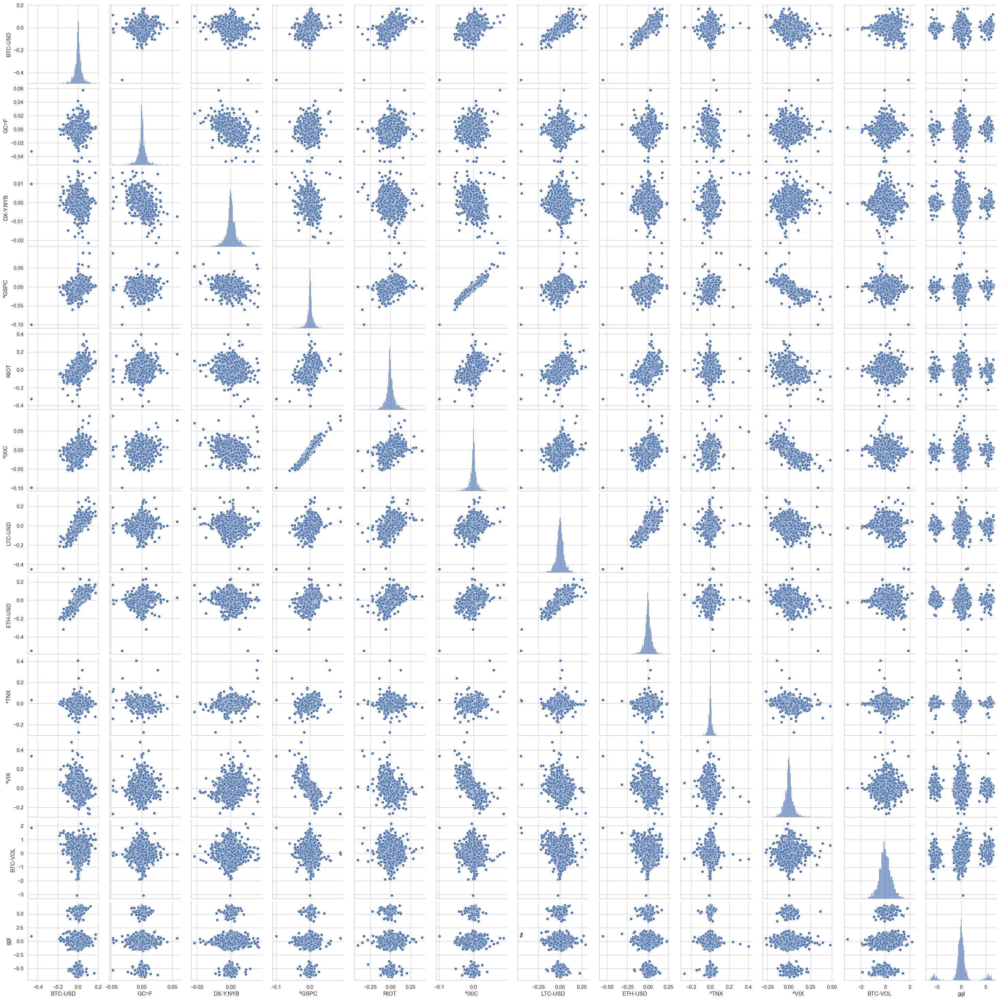

In [144]:
sns.pairplot(df_)


<Axes: >

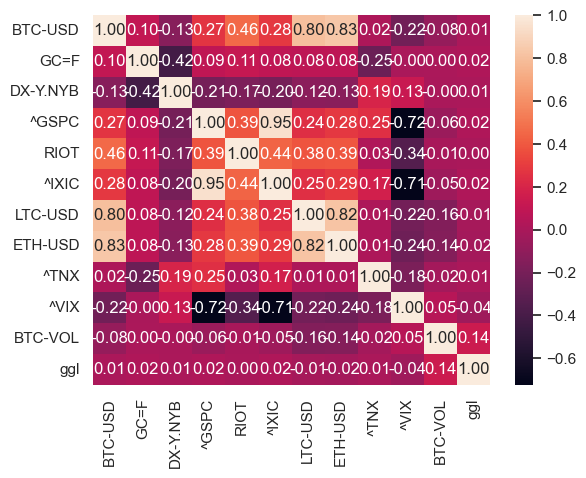

In [145]:
sns.heatmap(df_.corr(), annot=True, fmt=".2f")

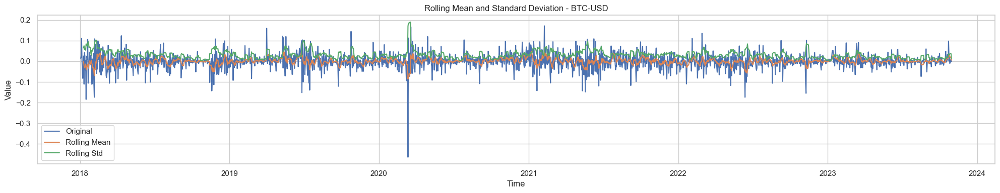

Augumented Dickey-Fuller Test
ADF Statistic: -16.127363320774535
p-value: 4.826044038707082e-29
Critical Values: {'1%': -3.4334397778912775, '5%': -2.8629049396081134, '10%': -2.5674966284215643}


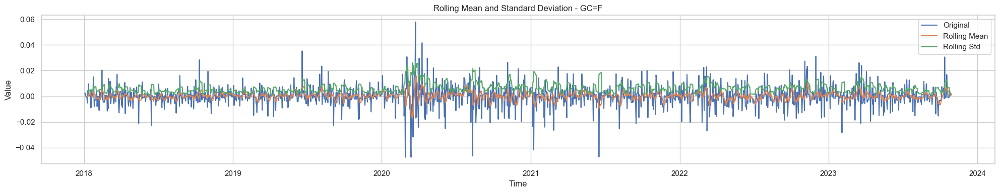

Augumented Dickey-Fuller Test
ADF Statistic: -17.79689553011014
p-value: 3.229968456864127e-30
Critical Values: {'1%': -3.4334397778912775, '5%': -2.8629049396081134, '10%': -2.5674966284215643}


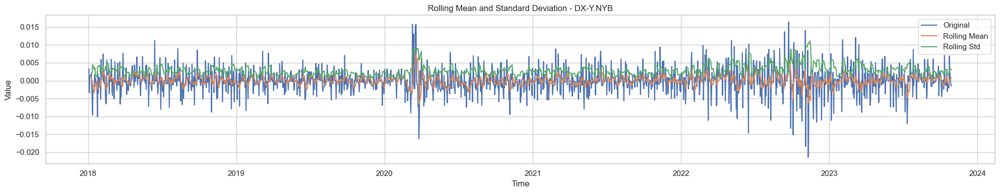

Augumented Dickey-Fuller Test
ADF Statistic: -42.39906713914942
p-value: 0.0
Critical Values: {'1%': -3.4334295922637375, '5%': -2.8629004423292788, '10%': -2.5674942338949123}


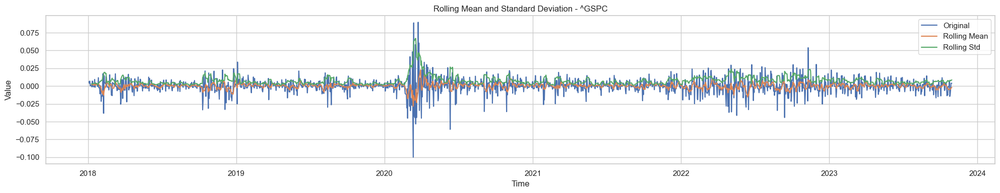

Augumented Dickey-Fuller Test
ADF Statistic: -10.08952622559145
p-value: 1.131821279882271e-17
Critical Values: {'1%': -3.4334573966160153, '5%': -2.8629127187998606, '10%': -2.5675007703726296}


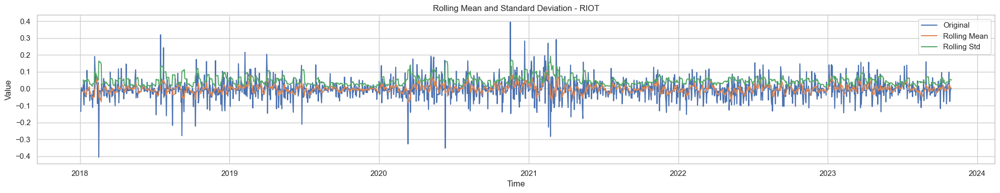

Augumented Dickey-Fuller Test
ADF Statistic: -23.972751782228396
p-value: 0.0
Critical Values: {'1%': -3.4334324955840154, '5%': -2.8629017242391734, '10%': -2.5674949164334784}


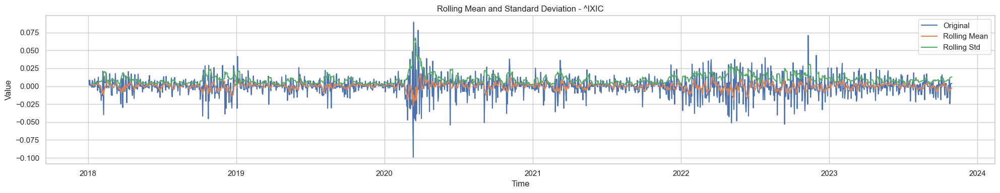

Augumented Dickey-Fuller Test
ADF Statistic: -9.832459569902381
p-value: 4.9952354950003824e-17
Critical Values: {'1%': -3.4334573966160153, '5%': -2.8629127187998606, '10%': -2.5675007703726296}


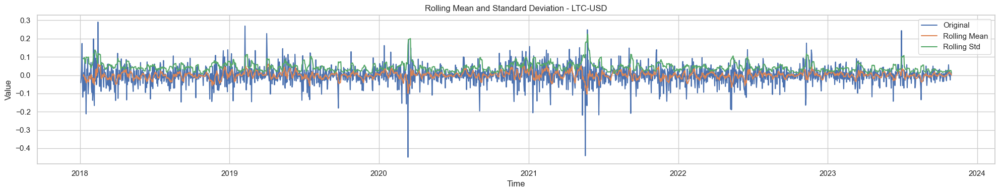

Augumented Dickey-Fuller Test
ADF Statistic: -48.22861419721995
p-value: 0.0
Critical Values: {'1%': -3.4334295922637375, '5%': -2.8629004423292788, '10%': -2.5674942338949123}


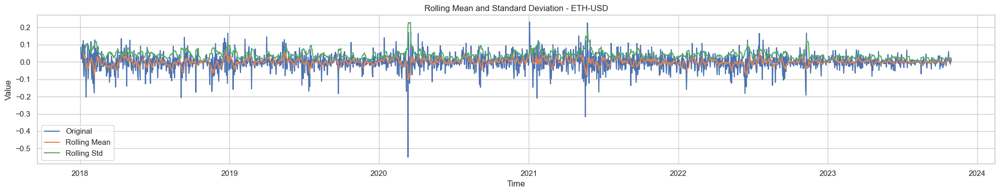

Augumented Dickey-Fuller Test
ADF Statistic: -13.964734667460265
p-value: 4.454112918794613e-26
Critical Values: {'1%': -3.433442700457683, '5%': -2.8629062300113994, '10%': -2.567497315483069}


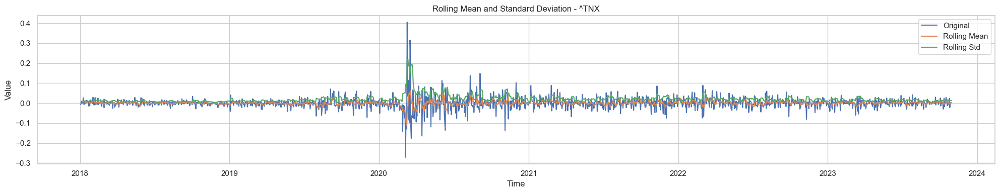

Augumented Dickey-Fuller Test
ADF Statistic: -12.896028980493485
p-value: 4.3469278538796694e-24
Critical Values: {'1%': -3.4334500311195946, '5%': -2.862909466719381, '10%': -2.567499038834725}


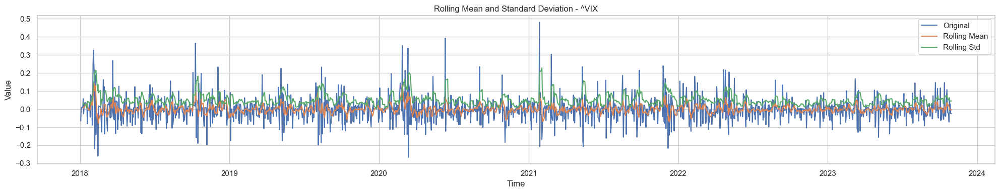

Augumented Dickey-Fuller Test
ADF Statistic: -24.38140872256854
p-value: 0.0
Critical Values: {'1%': -3.4334339492979784, '5%': -2.8629023661004833, '10%': -2.5674952581854216}


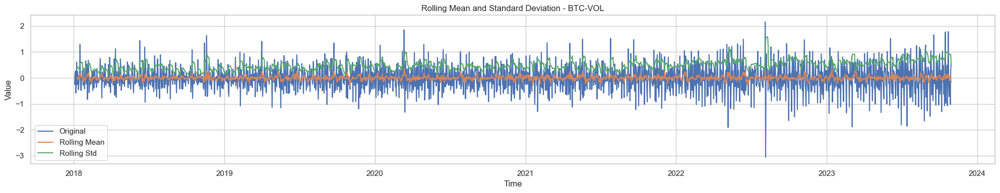

Augumented Dickey-Fuller Test
ADF Statistic: -14.264280758353204
p-value: 1.409312498535671e-26
Critical Values: {'1%': -3.43346776730731, '5%': -2.8629172977475434, '10%': -2.567503208390023}


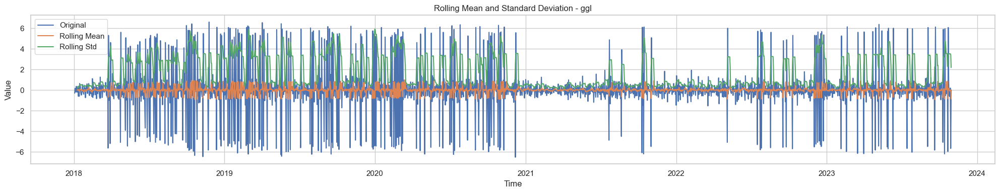

Augumented Dickey-Fuller Test
ADF Statistic: -14.132206130918144
p-value: 2.3230659419750074e-26
Critical Values: {'1%': -3.43346776730731, '5%': -2.8629172977475434, '10%': -2.567503208390023}


In [147]:
for column in df_.columns:
    test_stationarity(df_[column])

In [148]:
df_ = df_[["GC=F","DX-Y.NYB","^TNX","^GSPC","^VIX", "RIOT","LTC-USD","ggl","ETH-USD","BTC-VOL", "BTC-USD"]]
var = VAR(df_)

In [150]:
order = var.select_order(maxlags=10)
order.summary()

,AIC,BIC,FPE,HQIC
0,-71.77,-71.74,6.803e-32,-71.75
1,-72.15,-71.80*,4.637e-32,-72.02
2,-72.36,-71.68,3.761e-32,-72.11*
3,-72.43,-71.43,3.509e-32,-72.06
4,-72.48,-71.15,3.343e-32,-71.99
5,-72.61,-70.96,2.936e-32,-72.00
6,-72.72,-70.75,2.627e-32,-72.00
7,-72.75,-70.45,2.552e-32,-71.91
8,-72.77*,-70.16,2.488e-32*,-71.81
9,-72.75,-69.81,2.538e-32,-71.68


In [151]:
res = var.fit(8)
res.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 08, Nov, 2023
Time:                     03:00:55
--------------------------------------------------------------------
No. of Equations:         11.0000    BIC:                   -70.1463
Nobs:                     2119.00    HQIC:                  -71.8035
Log likelihood:           44994.9    FPE:                2.51582e-32
AIC:                     -72.7607    Det(Omega_mle):     1.60004e-32
--------------------------------------------------------------------
Results for equation GC=F
                 coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------
const               0.000190         0.000158            1.207           0.227
L1.GC=F            -0.024568         0.024946           -0.985           0.325
L1.DX-Y.NYB        -0.000885         0.055969           -0.016       

In [152]:
for column in df_.columns:
    print(column)
    target = column
    coefficients = pd.DataFrame(res.params[target])
    p_values = pd.DataFrame(res.pvalues[target])

    df_VAR = pd.concat([coefficients, p_values], axis=1)
    df_VAR.columns = ['Coefficients', 'p-values']

    df_VAR_filtered = df_VAR[df_VAR['p-values'] < 0.06].dropna()
    print(df_VAR_filtered)
    print("\n")

GC=F
          Coefficients  p-values
L1.^TNX      -0.027518  0.000019
L1.RIOT      -0.006811  0.045963
L2.GC=F       0.055786  0.024628
L3.ggl       -0.000374  0.010852
L4.ggl       -0.000343  0.027991
L6.^GSPC     -0.055790  0.028541
L6.^VIX      -0.007464  0.057099
L7.^TNX       0.017463  0.006670
L7.^GSPC      0.049824  0.050675
L8.GC=F      -0.087701  0.000443
L8.^TNX      -0.018870  0.003517


DX-Y.NYB
             Coefficients      p-values
L1.^TNX          0.013100  6.194402e-06
L1.^GSPC        -0.072676  2.403818e-10
L2.GC=F         -0.027251  1.482243e-02
L2.^GSPC        -0.038396  9.447701e-04
L2.^VIX         -0.004738  7.677647e-03
L4.^TNX         -0.005882  4.191918e-02
L4.^GSPC         0.023232  4.470632e-02
L7.GC=F          0.029966  7.159712e-03
L8.DX-Y.NYB     -0.067312  6.502418e-03


^TNX
             Coefficients      p-values
L1.^TNX          0.111393  3.656541e-06
L1.^GSPC        -0.238808  1.217610e-02
L2.GC=F         -0.196607  3.418679e-02
L2.DX-Y.NYB     -0.53

In [153]:
causality_vs_each(df_, res)

Granger causality F-test. H_0: DX-Y.NYB does not Granger-cause GC=F. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
        0.6637          1.939   0.724 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: ^TNX does not Granger-cause GC=F. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         6.852          1.939   0.000 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: ^GSPC does not Granger-cause GC=F. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         2.372          1.939   0.015 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: ^VIX does not Granger-caus

Granger causality F-test. H_0: BTC-VOL does not Granger-cause ^TNX. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         1.202          1.939   0.293 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: BTC-USD does not Granger-cause ^TNX. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
        0.5179          1.939   0.844 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: GC=F does not Granger-cause ^GSPC. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         1.080          1.939   0.373 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: DX-Y.NYB

Granger causality F-test. H_0: ^VIX does not Granger-cause LTC-USD. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         2.341          1.939   0.016 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: RIOT does not Granger-cause LTC-USD. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         2.064          1.939   0.036 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: ggl does not Granger-cause LTC-USD. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
        0.4242          1.939   0.907 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: ETH-USD does not Grange

Granger causality F-test. H_0: ETH-USD does not Granger-cause BTC-VOL. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         3.114          1.939   0.002 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: BTC-USD does not Granger-cause BTC-VOL. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
        0.8917          1.939   0.522 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: GC=F does not Granger-cause BTC-USD. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
        0.9322          1.939   0.488 (8, 22330)
------------------------------------------------
Granger causality F-test. H_0: DX-Y.NYB

In [154]:
l = res.forecast(res.endog, steps=100)
pred=[]
for row in l:
    pred.append(row[8])
pred

[0.009118743402488071,
 -0.009796191349361561,
 -0.005589456777532563,
 -0.01224073999035344,
 0.00019889577963333243,
 0.002574201311711967,
 0.004425480256201573,
 0.001293012865105532,
 -0.0019212545808526193,
 -2.794040920721906e-05,
 8.539149030564307e-05,
 -0.0008725890038258053,
 -0.0006286273917786653,
 -0.0005686988723716564,
 0.0019188606540499992,
 0.0014710770165456022,
 -2.3454647385289917e-05,
 -0.00039416132250879807,
 3.4199094380979326e-05,
 2.0074835009642076e-05,
 -0.0004876969687726984,
 0.0005581817715515278,
 0.0006322684437749881,
 0.0002524937953647285,
 0.00020590168971321957,
 0.00013586831887818388,
 -6.494775782974474e-05,
 -9.022297824875288e-05,
 0.00035894437917841543,
 0.0004084325809215329,
 0.00022446942056579764,
 0.00017313686235160007,
 0.00018194720377527724,
 0.00010284999105626889,
 4.954869392859569e-05,
 0.00023238850060595733,
 0.00030534220212952455,
 0.00021357970957366148,
 0.00017211854818354537,
 0.00017941177008262867,
 0.000140528328937

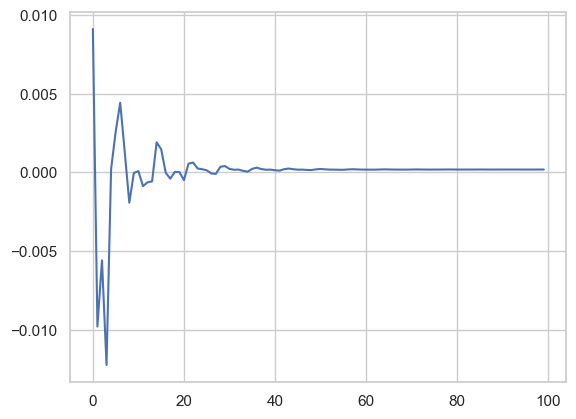

In [155]:
plt.plot(pred)

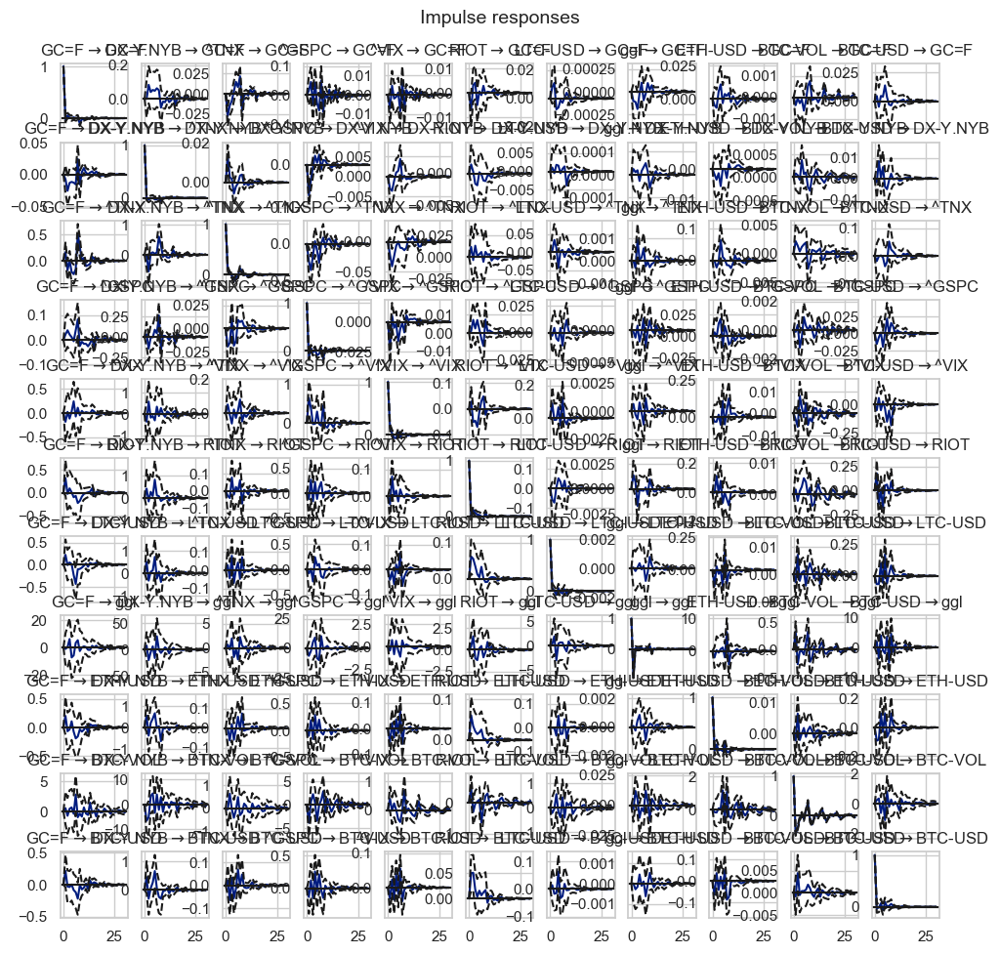

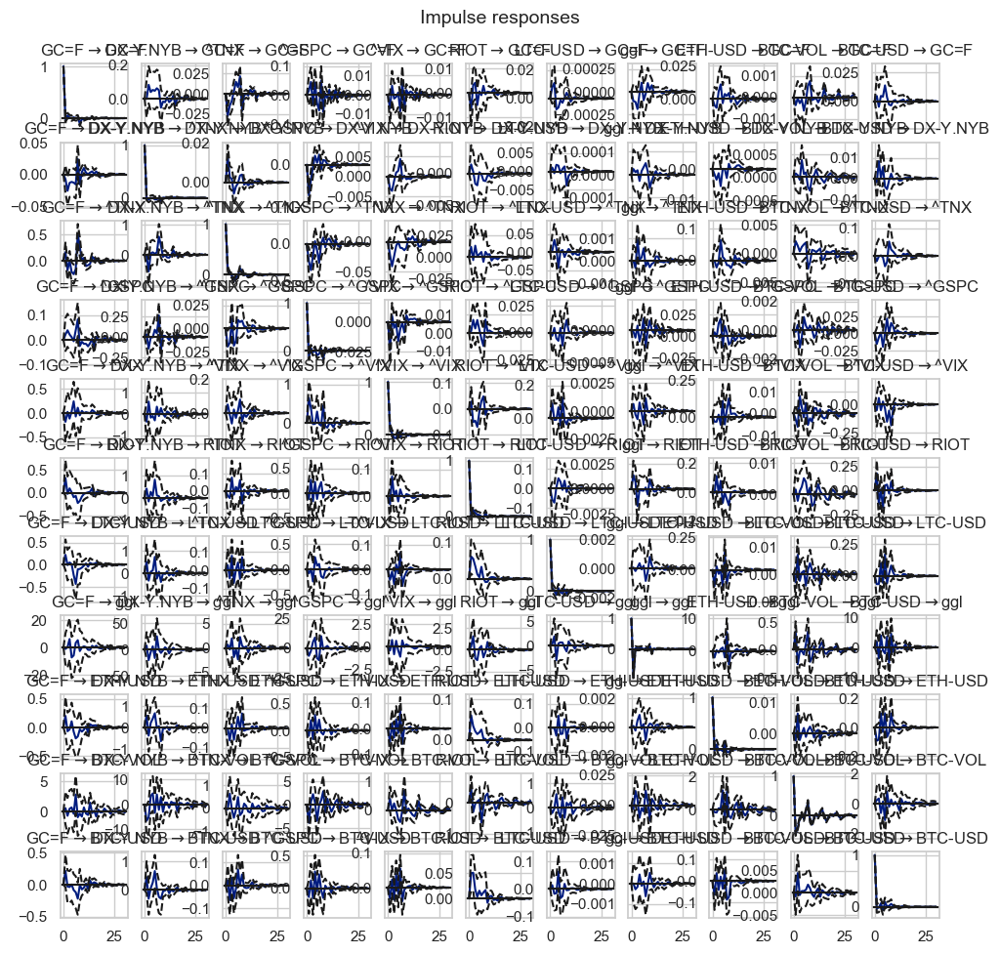

In [156]:
res.irf(30).plot()

FEVD for GC=F
          GC=F  DX-Y.NYB      ^TNX     ^GSPC      ^VIX      RIOT   LTC-USD       ggl   ETH-USD   BTC-VOL   BTC-USD
0     1.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000
1     0.984540  0.000366  0.006653  0.002671  0.001267  0.001046  0.002207  0.000673  0.000093  0.000350  0.000134
2     0.978042  0.000675  0.008165  0.004043  0.001823  0.001537  0.002636  0.001344  0.001086  0.000358  0.000291
3     0.972165  0.000871  0.009488  0.004196  0.001947  0.002462  0.002637  0.003440  0.001837  0.000536  0.000422
4     0.964568  0.000927  0.010308  0.007827  0.001951  0.002830  0.003202  0.003442  0.003882  0.000550  0.000513
5     0.957864  0.001641  0.012023  0.008439  0.001958  0.003259  0.003945  0.003774  0.003969  0.001417  0.001711
6     0.953248  0.002477  0.012540  0.008550  0.004098  0.003242  0.004039  0.004274  0.004291  0.001470  0.001771
7     0.942868  0.002728  0.019684  0.009224  0.005406  0.003612  

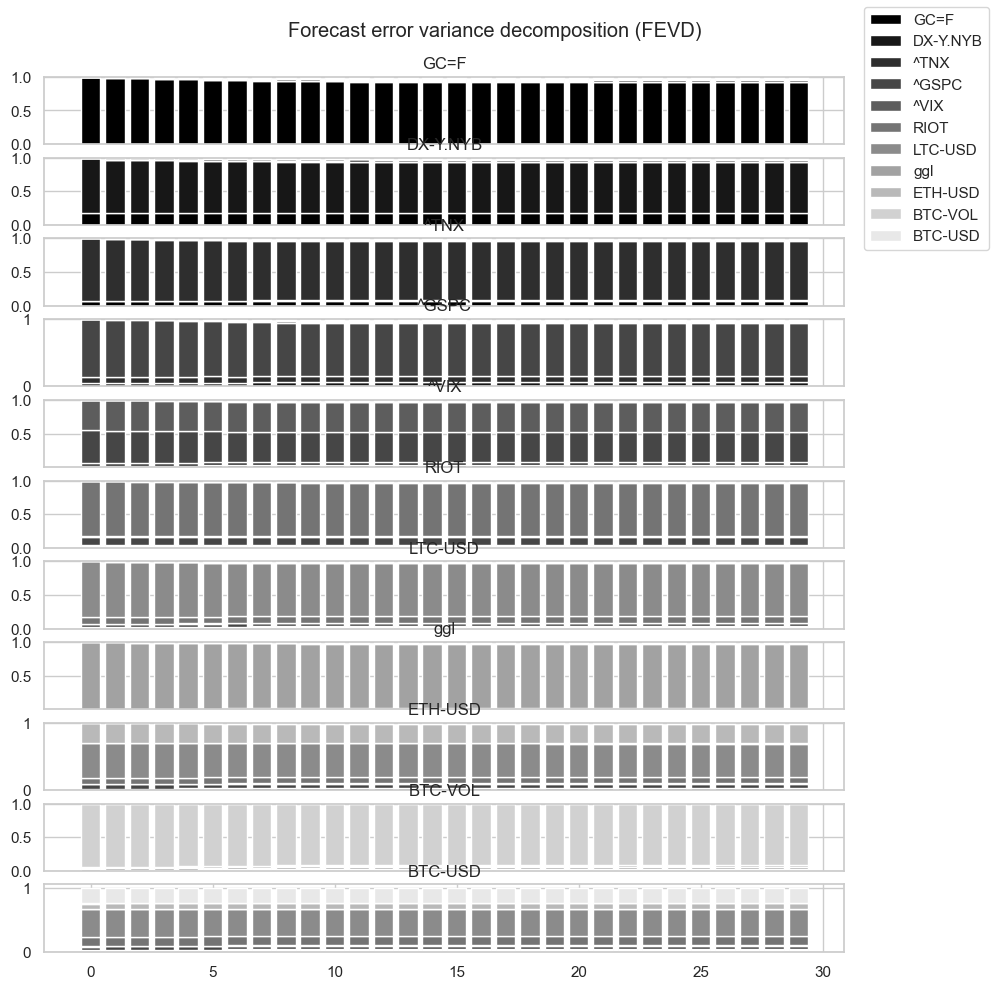

In [157]:
res.fevd(30).plot()
res.fevd(30).summary()

In [158]:
exog = sm.add_constant(df_[["GC=F", "DX-Y.NYB", "ggl","^TNX", "^GSPC", "BTC-VOL"]])
lin = RollingOLS(endog=df_["BTC-USD"], exog=exog, window=90)

In [159]:
Lin = lin.fit(method='lstsq', cov_type='HCCM', use_t=True)

In [160]:
Lin.params

,const,GC=F,DX-Y.NYB,ggl,^TNX,^GSPC,BTC-VOL
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2023-10-26,0.002714,0.225925,-0.819338,0.001294,-0.010652,0.558727,0.004342
2023-10-27,0.002614,0.226342,-0.806349,0.001289,-0.008479,0.566751,0.004396
2023-10-28,0.002727,0.230286,-0.806336,0.001276,-0.008189,0.574851,0.004381
2023-10-29,0.002960,0.245432,-0.819464,0.001096,-0.000822,0.596619,0.004654


In [161]:
pval = pd.DataFrame(Lin.pvalues, index=Lin.params.index, columns=Lin.params.columns)
pval

,const,GC=F,DX-Y.NYB,ggl,^TNX,^GSPC,BTC-VOL
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2023-10-26,0.199108,0.423445,0.460188,0.368405,0.950892,0.094072,0.242285
2023-10-27,0.209761,0.423035,0.466961,0.370037,0.961046,0.088380,0.243286
2023-10-28,0.197321,0.414323,0.466419,0.375323,0.962381,0.080856,0.241076
2023-10-29,0.173429,0.380219,0.458803,0.416403,0.996182,0.066897,0.220204


In [162]:
pval[pval<0.01].count()

const        60
GC=F        182
DX-Y.NYB     25
ggl          99
^TNX         26
^GSPC       584
BTC-VOL     134
dtype: int64

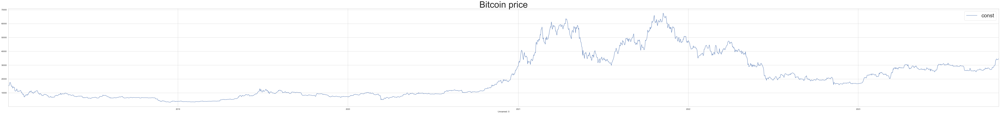

In [186]:
bit=pd.read_excel("bitcoin.xlsx")
bit.index=bit["Unnamed: 0"]
plt.figure(figsize=(100,10))
plt.xlim([pval.index[0], pval.index[-1]])
bit["BTC-USD"].plot()
plt.title("Bitcoin price", fontsize=50)
plt.legend(exog, fontsize=30)

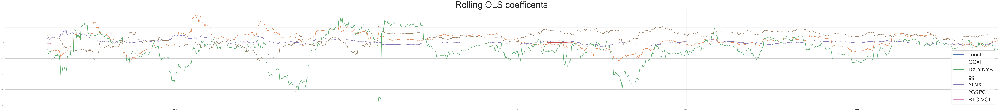

In [184]:
plt.figure(figsize=(100, 10))
plt.plot(Lin.params)
plt.xlim([pval.index[0], pval.index[-1]])
plt.legend(exog)
plt.title("Rolling OLS coefficents", fontsize=50)
plt.legend(exog, fontsize=30)

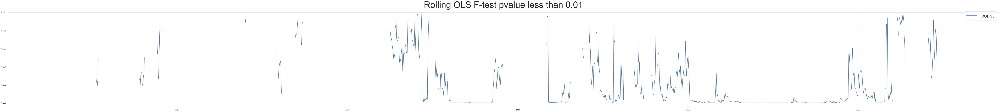

In [183]:
f=pd.DataFrame(Lin.f_pvalue, index=Lin.params.index)
plt.figure(figsize=(100, 10))
plt.xlim([pval.index[0], pval.index[-1]])
plt.plot(f[f<0.01])
plt.title("Rolling OLS F-test pvalue less than 0.01", fontsize=50)
plt.legend(exog, fontsize=30)

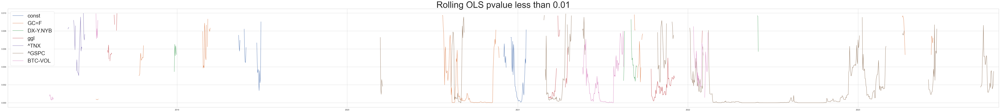

In [182]:
plt.figure(figsize=(100,10))
plt.plot(pval[pval<0.01])
plt.xlim([pval.index[0], pval.index[-1]])
plt.title("Rolling OLS pvalue less than 0.01", fontsize=50)
plt.legend(exog, fontsize=30)

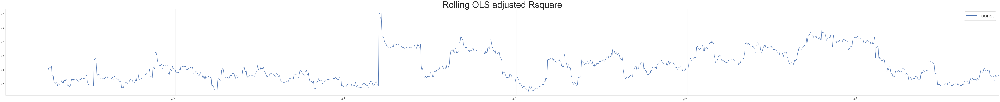

In [185]:
plt.figure(figsize=(100, 10))
plt.xlim([pval.index[0], pval.index[-1]])
Lin.rsquared_adj.plot()
plt.title("Rolling OLS adjusted Rsquare", fontsize=50)
plt.legend(exog, fontsize=30)

In [168]:
Lin.rsquared_adj.mean()

0.1256411618627889

In [169]:
f[f<0.01].count()

0    988
dtype: int64

In [240]:
for column in df2.columns:
    print(column)
    print(KPSS(df2[column], lags=12).summary())
    print("\n")

BTC-USD
    KPSS Stationarity Test Results   
Test Statistic                 10.870
P-value                         0.000
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: 0.74 (1%), 0.46 (5%), 0.35 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.


GC=F
    KPSS Stationarity Test Results   
Test Statistic                 13.126
P-value                         0.000
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: 0.74 (1%), 0.46 (5%), 0.35 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.


DX-Y.NYB
    KPSS Stationarity Test Results   
Test Statistic                  6.666
P-value                         0.000
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: 0.74 (1%), 0.46 (5

In [241]:
for column in df2.columns:
    print(column)
    print(DFGLS(df2[column], lags=12).summary())
    print("\n")

BTC-USD
      Dickey-Fuller GLS Results      
Test Statistic                 -0.880
P-value                         0.344
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: -2.58 (1%), -1.95 (5%), -1.63 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


GC=F
      Dickey-Fuller GLS Results      
Test Statistic                  0.488
P-value                         0.835
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: -2.58 (1%), -1.95 (5%), -1.63 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


DX-Y.NYB
      Dickey-Fuller GLS Results      
Test Statistic                 -0.022
P-value                         0.686
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: -2.58 (1%), 

In [325]:
df3 = df2[['BTC-USD', 'GC=F', 'DX-Y.NYB', '^GSPC','^TNX','ggl', 'BTC-VOL']]

In [326]:
order = vecm.select_order(df3,maxlags=14, deterministic="co", seasons=0) 
print(order.summary())

 VECM Order Selection (* highlights the minimums) 
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -45.50     -45.33*   1.741e-20      -45.44
1       -45.56      -45.26   1.633e-20     -45.45*
2       -45.58      -45.15   1.609e-20      -45.42
3       -45.56      -45.00   1.628e-20      -45.36
4       -45.57      -44.88   1.618e-20      -45.32
5       -45.66      -44.84   1.476e-20      -45.36
6       -45.74      -44.79   1.362e-20      -45.39
7       -45.78      -44.70   1.307e-20      -45.39
8       -45.82      -44.60   1.262e-20      -45.37
9       -45.81      -44.47   1.267e-20      -45.32
10      -45.80      -44.32   1.291e-20      -45.25
11      -45.81      -44.19   1.279e-20      -45.22
12      -45.82      -44.08   1.256e-20      -45.19
13      -45.88      -44.00   1.192e-20      -45.19
14     -45.88*      -43.88  1.185e-20*      -45.15
--------------------------------------------------


In [327]:
rank = vecm.select_coint_rank(df3, det_order = 1, k_ar_diff = 14, method = 'maxeig', signif=0.01)
print(rank.summary())

Johansen cointegration test using maximum eigenvalue test statistic with 1% significance level
r_0 r_1 test statistic critical value
-------------------------------------
  0   1          86.20          55.82
  1   2          51.94          49.41
  2   3          40.15          42.86
-------------------------------------


In [328]:
rank = vecm.select_coint_rank(df3, det_order = 1, k_ar_diff = 14, method = 'trace', signif=0.01)
print(rank.summary())

Johansen cointegration test using trace test statistic with 1% significance level
r_0 r_1 test statistic critical value
-------------------------------------
  0   7          219.0          150.1
  1   7          132.8          117.0
  2   7          80.90          87.77
-------------------------------------


In [329]:
df2.columns

Index(['BTC-USD', 'GC=F', 'DX-Y.NYB', '^GSPC', 'RIOT', '^IXIC', 'LTC-USD',
       'ETH-USD', '^TNX', '^VIX', 'BTC-VOL', 'ggl'],
      dtype='object')

In [330]:
df3.columns

Index(['BTC-USD', 'GC=F', 'DX-Y.NYB', '^GSPC', '^TNX', 'ggl', 'BTC-VOL'], dtype='object')

In [332]:
vecmodel = vecm.VECM(df3, k_ar_diff=14, coint_rank=2,deterministic='ci', seasons=0) 
vecres = vecmodel.fit()
print(vecres.summary())

Det. terms outside the coint. relation & lagged endog. parameters for equation BTC-USD
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
L1.BTC-USD      -0.0418      0.023     -1.851      0.064      -0.086       0.002
L1.GC=F          0.2047      0.126      1.621      0.105      -0.043       0.452
L1.DX-Y.NYB      0.4729      0.284      1.666      0.096      -0.084       1.029
L1.^GSPC         0.0008      0.092      0.009      0.993      -0.179       0.181
L1.^TNX          0.0223      0.033      0.680      0.496      -0.042       0.087
L1.ggl          -0.0019      0.001     -1.385      0.166      -0.005       0.001
L1.BTC-VOL       0.0018      0.004      0.506      0.613      -0.005       0.009
L2.BTC-USD       0.0406      0.022      1.806      0.071      -0.003       0.085
L2.GC=F         -0.0036      0.126     -0.029      0.977      -0.250       0.243
L2.DX-Y.NYB     -0.346

In [338]:
var = VaR(df3[["BTC-USD", "^GSPC"]], np.array([0.5, 0.5]))
var

<VaR - μ: 891.24%, σ: 48.8207%, Portfolio σ: 48.8321%>

In [339]:
var.summary()

,VaR(95.0),VaR(97.5),VaR(99.0),ES(95.0),ES(97.5),ES(99.0),CDaR(95.0),CDaR(97.5),CDaR(99.0)
2023-11-08,,,,,,,,,
Parametric,8.109191,7.955316,7.776403,8.051511,7.955316,7.776403,0.000000,0.000000,0.000000
Historical,8.114800,8.046586,8.027680,8.053209,8.024638,8.009663,0.000000,0.000000,0.000000
Monte Carlo,-9.731931,-9.897146,-10.076416,-9.731931,-9.897146,-10.076416,0.375261,0.375261,0.375261
GARCH,-1.307930,-1.558494,-1.849830,-1.307930,-1.558494,-1.849830,0.375261,0.375261,0.375261


In [340]:
var2 = VaR(df3[["GC=F", "^GSPC"]], np.array([0.5, 0.5]))
var2

<VaR - μ: 777.8%, σ: 17.0958%, Portfolio σ: 17.0998%>

In [341]:
var2.summary()

,VaR(95.0),VaR(97.5),VaR(99.0),ES(95.0),ES(97.5),ES(99.0),CDaR(95.0),CDaR(97.5),CDaR(99.0)
2023-11-08,,,,,,,,,
Parametric,7.496728,7.442845,7.380194,7.483040,7.442845,7.380194,0.000000,0.000000,0.000000
Historical,7.518280,7.505855,7.491846,7.502534,7.491735,7.479920,0.000000,0.000000,0.000000
Monte Carlo,-8.052733,-8.103040,-8.171621,-8.052733,-8.103040,-8.171621,0.043909,0.043909,0.043909
GARCH,-0.136243,-0.162344,-0.192691,-0.136243,-0.162344,-0.192691,0.043909,0.043909,0.043909


In [344]:
var3 = VaR(df3[["BTC-USD", "GC=F", "^GSPC"]], np.array([0.33, 0.33, 0.34]))
var3

<VaR - μ: 840.48%, σ: 36.8149%, Portfolio σ: 36.8235%>

In [345]:
var3.summary()

,VaR(95.0),VaR(97.5),VaR(99.0),ES(95.0),ES(97.5),ES(99.0),CDaR(95.0),CDaR(97.5),CDaR(99.0)
2023-11-08,,,,,,,,,
Parametric,7.799157,7.683122,7.548207,7.756182,7.683122,7.548207,0.000000,0.000000,0.000000
Historical,7.797318,7.750565,7.736786,7.755398,7.735115,7.720916,0.000000,0.000000,0.000000
Monte Carlo,-9.023326,-9.136926,-9.296777,-9.023326,-9.136926,-9.296777,0.235798,0.235798,0.235798
GARCH,-0.145573,-0.173461,-0.205887,-0.145573,-0.173461,-0.205887,0.235798,0.235798,0.235798


In [170]:
for model in df_.columns:
    print(model)
    data = df_[model]
    univariate = Univariate()
    univariate.fit(data)
    print(univariate.to_dict())
    print("\n")

GC=F
{'df': 1.9922419081788616, 'loc': 0.0002900302520972664, 'scale': 0.0034065147882936567, 'type': 'copulas.univariate.student_t.StudentTUnivariate'}


DX-Y.NYB
{'c': 11.136450000890349, 'loc': -0.023421034636583085, 'scale': 0.02348707585363674, 'type': 'copulas.univariate.log_laplace.LogLaplace'}


^TNX
{'df': 1.8201406699014764, 'loc': 0.0007080196486996293, 'scale': 0.01087930007230274, 'type': 'copulas.univariate.student_t.StudentTUnivariate'}


^GSPC
{'df': 1.6881213669705184, 'loc': 0.0004065709414130933, 'scale': 0.0040328584273202055, 'type': 'copulas.univariate.student_t.StudentTUnivariate'}


^VIX
{'dataset': [-0.06556267531195109, 0.007621228933663394, 0.0, 0.010787597639951593, 0.010672466263489486, 0.010559766453839013, 0.05715835818668655, -0.026132163784968167, 0.006091432053454601, 0.02794590378897739, 0.036244605640409405, 0.03497675308666978, 0.033794610889275545, 0.03268977108770917, 0.02121420271955673, 0.02569560503977075, -0.08092960692565507, -0.0071238270279

{'dataset': [-0.13568420725739092, -0.0037014292973721976, 0.0065708591616878195, -0.013876711205776911, -0.014071987287097392, -0.014272837841408018, 0.025296474282230298, -0.04600470072758951, -0.09552816844113243, 0.04821897265687111, -0.042003358048490744, -0.04384529012507153, -0.04585620565759104, -0.04806048177777034, -0.028858853137153112, 0.1087331487166785, 0.00554021124402966, -0.007225105942411015, -0.007277688241377369, -0.00733104151320761, 0.006141310983985454, -0.018538152357797474, -0.07163222578849823, -0.04452794420891509, -0.03767296621320899, -0.03914796753835187, -0.04074319274207951, -0.06440719863841965, -0.03782111409936146, -0.11143954622730919, -0.011447413895596566, -0.040844839960862314, -0.04258444701143331, -0.04447885337520679, 0.19085204977481351, 0.10056136680435573, 0.03903272953184611, 0.07501893228766779, 0.03047585733188205, 0.029574481941247226, 0.028724897826592967, -0.08815236387586134, 0.032468438135219296, 0.03610931477641595, -0.4060467135610

{'c': 86695040.67223284, 'loc': -3028758.4944136976, 'scale': 3028758.4945196137, 'type': 'copulas.univariate.log_laplace.LogLaplace'}


ggl
{'df': 1.0185769167717766, 'loc': -0.004725705387325342, 'scale': 0.442645781547686, 'type': 'copulas.univariate.student_t.StudentTUnivariate'}


ETH-USD
{'c': 205656063.65038475, 'loc': -6650759.95417591, 'scale': 6650759.954612153, 'type': 'copulas.univariate.log_laplace.LogLaplace'}


BTC-VOL
{'dataset': [-0.25080440459191844, 0.16626093039906992, 0.2595278690552671, -0.5792162808590111, -0.1867027397964049, 0.6117622404698798, -0.2591901800819082, 0.24833257694195793, 0.11071753790101706, -0.4440980396469807, -0.2967073989006702, 0.0802388037789897, 0.06364050197437246, 1.2911923729958714, 0.07770618403212806, -0.47098989452876483, -0.4869911828285946, 0.028360959660198637, -0.06001131148818695, 0.2796877918711037, -0.05611901611885357, -0.2789961331942025, -0.18457916877321867, 0.37697789526129766, -0.4227017579195819, -0.06048903414160732, -

{'c': 649010.3582250271, 'loc': -15808.55511814097, 'scale': 15808.555866401024, 'type': 'copulas.univariate.log_laplace.LogLaplace'}




In [424]:
StudentTCopula().fit_corr_param(df3[["BTC-USD", "^GSPC"]])

0.8982745420126677

In [446]:
copula = StudentTCopula(corr=StudentTCopula().fit_corr_param(df3[["BTC-USD", "^GSPC"]]), df=len(df3["BTC-USD"])-1,k_dim=2)


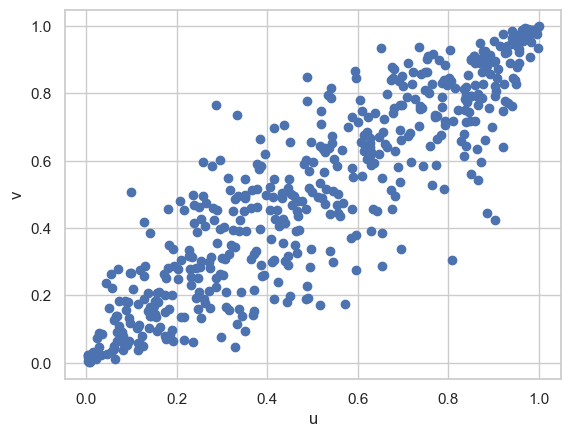

In [452]:
_ = copula.plot_scatter()

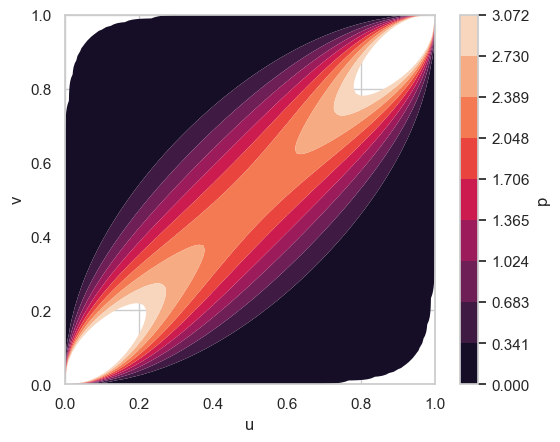

In [448]:
__ = copula.plot_pdf()